# 무신사 데이터 분석 및 머신러닝 프로젝트

##### 라이브러리 임포트

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import tree
from IPython.display import Image
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import pydotplus
import os
os.environ["PATH"]+=os.pathsep+"c:/ai/program/graphviz/bin/"
plt.style.use('seaborn')
sns.set(font_scale=2.5)

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# 데이터 읽기

In [2]:
df_train = pd.read_csv("musinsa_final.csv")
#df_train = df_train.sort_values("TOTAL_SELL", ascending=False)
#title컬럼을 기준으로 중복 값 제거
df_train = df_train.drop_duplicates(['TITLE'])
df_train

,index,TITLE,BRAND,SEASON,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,2019ALL/,남,348380.0,28631.0,10000.0,12150.0,8845.0,94.0,2.0,31900.0,NaN,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,2019F/W/,남,170611.0,7235.0,3116.0,3617.0,2441.0,95.0,2.0,256800.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,2019F/W/,남,272331.0,16828.0,18525.0,10969.0,8960.0,94.0,2.0,86400.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,NaN,라이프,74163.0,7716.0,3305.0,1712.0,909.0,96.0,2.0,159500.0,NaN,이어폰,https://image.msscdn.net/images/goods_img/2019...
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,2019F/W/,남,206928.0,6086.0,2286.0,3472.0,611.0,95.0,2.0,139000.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
5,5,M/G SMALL SIGN LOGO HOODIE GRAY|M/G SMALL SIGN...,MARK GONZALES,NaN,남,48557.0,6176.0,NaN,3354.0,2042.0,94.0,3.0,45500.0,30.0,후드 스웨트셔츠/후드 집업,https://image.msscdn.net/images/goods_img/2018...
6,6,캐시미어 블렌드 오버사이즈 더블 코트 [블랙]|CASHMERE BLEND OVERS...,MUSINSA STANDARD,2019ALL/,남,101255.0,4519.0,1000.0,2200.0,1703.0,95.0,2.0,143900.0,10.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2018...
7,7,[세트] 하프 폴라 니트 티셔츠|[SET] Half Pola Knit T-Shirt,ESN,NaN,남,368097.0,38074.0,71638.0,23459.0,27760.0,92.0,2.0,32760.0,58.0,니트/스웨터/카디건,https://image.msscdn.net/images/goods_img/2017...
8,8,프리미엄 헝가리 구스 다운 007 숏푸퍼 블랙|프리미엄 헝가리 구스 다운 007 숏...,COVERNAT,2019F/W/,남,383013.0,7557.0,NaN,3154.0,998.0,94.0,3.0,154700.0,35.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
9,9,[무신사 단독특가] FW 미니멀 스탠다드 카고조거 슬랙스|[무신사 단독특가] FW ...,SEVENSELAH,NaN,남,158629.0,12753.0,12177.0,6327.0,2249.0,93.0,2.0,57900.0,35.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...


In [3]:
df_train.describe()

,index,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE
count,43311.000000,43310.000000,42362.000000,7676.000000,37462.000000,15600.000000,43310.000000,42917.000000,4.331000e+04,23612.000000
mean,26115.588349,1399.053198,150.671569,477.658155,110.562036,370.021026,90.371277,1.962206,1.283339e+05,33.723827
std,14261.416959,10468.865875,1060.262019,2354.779404,703.722698,2247.306914,13.323649,0.747174,1.841422e+05,15.502748
min,0.000000,6.000000,0.000000,10.000000,1.000000,0.000000,20.000000,0.000000,5.000000e+03,3.000000
25%,13954.500000,49.000000,3.000000,15.000000,3.000000,2.000000,80.000000,2.000000,4.550000e+04,20.000000
50%,26526.000000,95.000000,10.000000,29.000000,10.000000,6.000000,95.000000,2.000000,7.200000e+04,30.000000
75%,38433.500000,295.000000,37.000000,96.000000,32.000000,27.000000,100.000000,2.000000,1.399000e+05,43.000000
max,50126.000000,812749.000000,44356.000000,71638.000000,25964.000000,43588.000000,100.000000,14.000000,5.391000e+06,90.000000


In [4]:
#널 값의 비율을 알아본다
df_train.isnull().sum()/len(df_train)

index            0.000000
TITLE            0.000023
BRAND            0.000023
SEASON           0.398259
SEX              0.000023
POPULARITY       0.000023
BUCKET           0.021911
TOTAL_SELL       0.822770
LIKE_            0.135047
REVIEW           0.639814
SATISFACTION     0.000023
DELIVERY_DATE    0.009097
PRICE            0.000023
SALE             0.454827
CATEGORY_        0.000023
IMG_URL          0.000023
dtype: float64

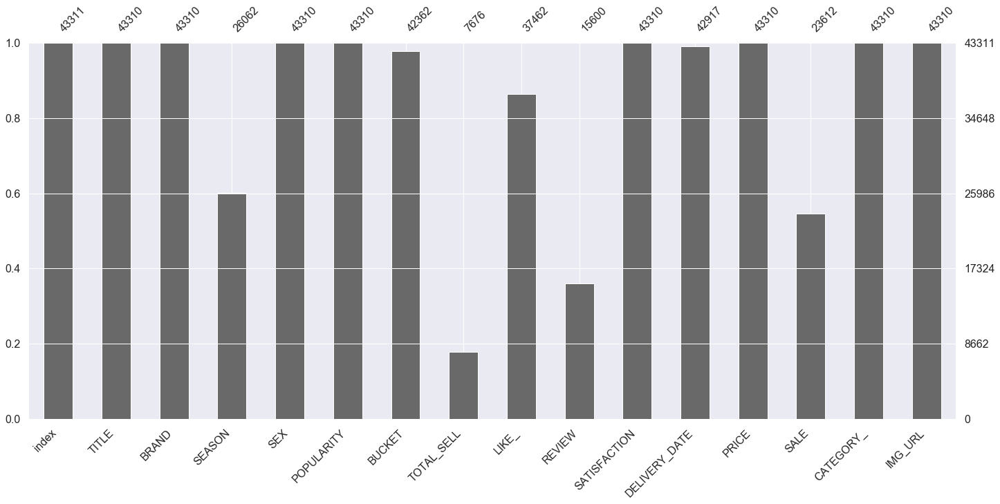

In [5]:
import missingno as msno

msno.bar(df=df_train)

In [6]:
#SALE의 null값은 할인률이 없는, 즉 할인하지 않는다는 의미이므로 0%로 바꿔준다
df_train['SALE'] = np.where(df_train['SALE'].isnull() ,0 , df_train['SALE'])
df_train

,index,TITLE,BRAND,SEASON,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,2019ALL/,남,348380.0,28631.0,10000.0,12150.0,8845.0,94.0,2.0,31900.0,0.0,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,2019F/W/,남,170611.0,7235.0,3116.0,3617.0,2441.0,95.0,2.0,256800.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,2019F/W/,남,272331.0,16828.0,18525.0,10969.0,8960.0,94.0,2.0,86400.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,NaN,라이프,74163.0,7716.0,3305.0,1712.0,909.0,96.0,2.0,159500.0,0.0,이어폰,https://image.msscdn.net/images/goods_img/2019...
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,2019F/W/,남,206928.0,6086.0,2286.0,3472.0,611.0,95.0,2.0,139000.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
5,5,M/G SMALL SIGN LOGO HOODIE GRAY|M/G SMALL SIGN...,MARK GONZALES,NaN,남,48557.0,6176.0,NaN,3354.0,2042.0,94.0,3.0,45500.0,30.0,후드 스웨트셔츠/후드 집업,https://image.msscdn.net/images/goods_img/2018...
6,6,캐시미어 블렌드 오버사이즈 더블 코트 [블랙]|CASHMERE BLEND OVERS...,MUSINSA STANDARD,2019ALL/,남,101255.0,4519.0,1000.0,2200.0,1703.0,95.0,2.0,143900.0,10.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2018...
7,7,[세트] 하프 폴라 니트 티셔츠|[SET] Half Pola Knit T-Shirt,ESN,NaN,남,368097.0,38074.0,71638.0,23459.0,27760.0,92.0,2.0,32760.0,58.0,니트/스웨터/카디건,https://image.msscdn.net/images/goods_img/2017...
8,8,프리미엄 헝가리 구스 다운 007 숏푸퍼 블랙|프리미엄 헝가리 구스 다운 007 숏...,COVERNAT,2019F/W/,남,383013.0,7557.0,NaN,3154.0,998.0,94.0,3.0,154700.0,35.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
9,9,[무신사 단독특가] FW 미니멀 스탠다드 카고조거 슬랙스|[무신사 단독특가] FW ...,SEVENSELAH,NaN,남,158629.0,12753.0,12177.0,6327.0,2249.0,93.0,2.0,57900.0,35.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...


In [7]:
#LIKE의 null값은 좋아요를 1개도 받지 못했다는 의미이므로 0개로 바꿔준다
df_train['LIKE_'] = np.where(df_train['LIKE_'].isnull() ,0 , df_train['LIKE_'])
df_train

,index,TITLE,BRAND,SEASON,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,2019ALL/,남,348380.0,28631.0,10000.0,12150.0,8845.0,94.0,2.0,31900.0,0.0,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,2019F/W/,남,170611.0,7235.0,3116.0,3617.0,2441.0,95.0,2.0,256800.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,2019F/W/,남,272331.0,16828.0,18525.0,10969.0,8960.0,94.0,2.0,86400.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,NaN,라이프,74163.0,7716.0,3305.0,1712.0,909.0,96.0,2.0,159500.0,0.0,이어폰,https://image.msscdn.net/images/goods_img/2019...
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,2019F/W/,남,206928.0,6086.0,2286.0,3472.0,611.0,95.0,2.0,139000.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
5,5,M/G SMALL SIGN LOGO HOODIE GRAY|M/G SMALL SIGN...,MARK GONZALES,NaN,남,48557.0,6176.0,NaN,3354.0,2042.0,94.0,3.0,45500.0,30.0,후드 스웨트셔츠/후드 집업,https://image.msscdn.net/images/goods_img/2018...
6,6,캐시미어 블렌드 오버사이즈 더블 코트 [블랙]|CASHMERE BLEND OVERS...,MUSINSA STANDARD,2019ALL/,남,101255.0,4519.0,1000.0,2200.0,1703.0,95.0,2.0,143900.0,10.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2018...
7,7,[세트] 하프 폴라 니트 티셔츠|[SET] Half Pola Knit T-Shirt,ESN,NaN,남,368097.0,38074.0,71638.0,23459.0,27760.0,92.0,2.0,32760.0,58.0,니트/스웨터/카디건,https://image.msscdn.net/images/goods_img/2017...
8,8,프리미엄 헝가리 구스 다운 007 숏푸퍼 블랙|프리미엄 헝가리 구스 다운 007 숏...,COVERNAT,2019F/W/,남,383013.0,7557.0,NaN,3154.0,998.0,94.0,3.0,154700.0,35.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
9,9,[무신사 단독특가] FW 미니멀 스탠다드 카고조거 슬랙스|[무신사 단독특가] FW ...,SEVENSELAH,NaN,남,158629.0,12753.0,12177.0,6327.0,2249.0,93.0,2.0,57900.0,35.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...


In [8]:
# season, review 항목은 사용하지 않기로 한다.
df_train = df_train.drop(['SEASON'] , axis=1)
df_train

,index,TITLE,BRAND,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,남,348380.0,28631.0,10000.0,12150.0,8845.0,94.0,2.0,31900.0,0.0,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,남,170611.0,7235.0,3116.0,3617.0,2441.0,95.0,2.0,256800.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,남,272331.0,16828.0,18525.0,10969.0,8960.0,94.0,2.0,86400.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,라이프,74163.0,7716.0,3305.0,1712.0,909.0,96.0,2.0,159500.0,0.0,이어폰,https://image.msscdn.net/images/goods_img/2019...
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,남,206928.0,6086.0,2286.0,3472.0,611.0,95.0,2.0,139000.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
5,5,M/G SMALL SIGN LOGO HOODIE GRAY|M/G SMALL SIGN...,MARK GONZALES,남,48557.0,6176.0,NaN,3354.0,2042.0,94.0,3.0,45500.0,30.0,후드 스웨트셔츠/후드 집업,https://image.msscdn.net/images/goods_img/2018...
6,6,캐시미어 블렌드 오버사이즈 더블 코트 [블랙]|CASHMERE BLEND OVERS...,MUSINSA STANDARD,남,101255.0,4519.0,1000.0,2200.0,1703.0,95.0,2.0,143900.0,10.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2018...
7,7,[세트] 하프 폴라 니트 티셔츠|[SET] Half Pola Knit T-Shirt,ESN,남,368097.0,38074.0,71638.0,23459.0,27760.0,92.0,2.0,32760.0,58.0,니트/스웨터/카디건,https://image.msscdn.net/images/goods_img/2017...
8,8,프리미엄 헝가리 구스 다운 007 숏푸퍼 블랙|프리미엄 헝가리 구스 다운 007 숏...,COVERNAT,남,383013.0,7557.0,NaN,3154.0,998.0,94.0,3.0,154700.0,35.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
9,9,[무신사 단독특가] FW 미니멀 스탠다드 카고조거 슬랙스|[무신사 단독특가] FW ...,SEVENSELAH,남,158629.0,12753.0,12177.0,6327.0,2249.0,93.0,2.0,57900.0,35.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...


In [9]:
#null값이 총 row의 10%를 넘어버리면 분석에 방해를 준다
#y축인 TOTAL_SELL 값의 null 값이 40000이 되므로 삭제한다.
df_train = df_train.dropna()
df_train

,index,TITLE,BRAND,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,남,348380.0,28631.0,10000.0,12150.0,8845.0,94.0,2.0,31900.0,0.0,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,남,170611.0,7235.0,3116.0,3617.0,2441.0,95.0,2.0,256800.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,남,272331.0,16828.0,18525.0,10969.0,8960.0,94.0,2.0,86400.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,라이프,74163.0,7716.0,3305.0,1712.0,909.0,96.0,2.0,159500.0,0.0,이어폰,https://image.msscdn.net/images/goods_img/2019...
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,남,206928.0,6086.0,2286.0,3472.0,611.0,95.0,2.0,139000.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...
6,6,캐시미어 블렌드 오버사이즈 더블 코트 [블랙]|CASHMERE BLEND OVERS...,MUSINSA STANDARD,남,101255.0,4519.0,1000.0,2200.0,1703.0,95.0,2.0,143900.0,10.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2018...
7,7,[세트] 하프 폴라 니트 티셔츠|[SET] Half Pola Knit T-Shirt,ESN,남,368097.0,38074.0,71638.0,23459.0,27760.0,92.0,2.0,32760.0,58.0,니트/스웨터/카디건,https://image.msscdn.net/images/goods_img/2017...
9,9,[무신사 단독특가] FW 미니멀 스탠다드 카고조거 슬랙스|[무신사 단독특가] FW ...,SEVENSELAH,남,158629.0,12753.0,12177.0,6327.0,2249.0,93.0,2.0,57900.0,35.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...
10,10,CARGO STRING PANTS _ BLACK|CARGO STRING PANTS ...,FRIZMWORKS,남,13882.0,3696.0,2803.0,2727.0,863.0,92.0,3.0,62000.0,0.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...
11,11,12/19 배송 오버사이즈 무스탕 자켓 [GREYISH BEIGE]|OVERSIZE...,DRAW FIT,남,74534.0,3336.0,1053.0,1858.0,669.0,85.0,2.0,158400.0,20.0,레더/라이더스 재킷,https://image.msscdn.net/images/goods_img/2019...


# 타겟값 분류

> 랭킹 페이지에서 10페이지 이하에 들어갈수록 상품의 판매량이 좋아질 것으로 예상한다. 따라서, 중복 값 제거 후의 인덱스 값(랭킹 순위)에 따라 800 이하일 경우를 1로, 이상일 경우를 0으로 놓는다.

In [10]:
# 상위 페이지를 나타내는 칼럼 'first_page' 생성, 0과 1로 나누어진다.
df_train['FIRST_PAGE'] = 0
df_train.head()

,index,TITLE,BRAND,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL,FIRST_PAGE
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,남,348380.0,28631.0,10000.0,12150.0,8845.0,94.0,2.0,31900.0,0.0,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...,0
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,남,170611.0,7235.0,3116.0,3617.0,2441.0,95.0,2.0,256800.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...,0
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,남,272331.0,16828.0,18525.0,10969.0,8960.0,94.0,2.0,86400.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...,0
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,라이프,74163.0,7716.0,3305.0,1712.0,909.0,96.0,2.0,159500.0,0.0,이어폰,https://image.msscdn.net/images/goods_img/2019...,0
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,남,206928.0,6086.0,2286.0,3472.0,611.0,95.0,2.0,139000.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...,0


In [11]:
# 1 페이지는 80개의 상품을 가지고 있기 때문에 상위 800개만 10페이지에 들어가게 된다.
df_train['FIRST_PAGE'][0:800] = 1
df_train.head()

,index,TITLE,BRAND,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL,FIRST_PAGE
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,남,348380.0,28631.0,10000.0,12150.0,8845.0,94.0,2.0,31900.0,0.0,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...,1
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,남,170611.0,7235.0,3116.0,3617.0,2441.0,95.0,2.0,256800.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...,1
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,남,272331.0,16828.0,18525.0,10969.0,8960.0,94.0,2.0,86400.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...,1
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,라이프,74163.0,7716.0,3305.0,1712.0,909.0,96.0,2.0,159500.0,0.0,이어폰,https://image.msscdn.net/images/goods_img/2019...,1
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,남,206928.0,6086.0,2286.0,3472.0,611.0,95.0,2.0,139000.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...,1


In [12]:
# first_page에 저장된 값들의 빈도수
df_train['FIRST_PAGE'].value_counts()

0    6482
1     800
Name: FIRST_PAGE, dtype: int64

In [13]:
#
total_sell_means = pd.DataFrame(data=[df_train['TOTAL_SELL'][0:1000].mean(),df_train['TOTAL_SELL'][1001:2000].mean(),df_train['TOTAL_SELL'][2001:3000].mean(),df_train['TOTAL_SELL'][3001:4000].mean(),df_train['TOTAL_SELL'][4001:5000].mean(),df_train['TOTAL_SELL'][5001:6000].mean(),df_train['TOTAL_SELL'][6001:7000].mean(),df_train['TOTAL_SELL'][7001:].mean()], index=range(0,8), columns=['means'])
display(pd.DataFrame(total_sell_means))

,means
0,2330.684000
1,847.789790
2,348.754755
3,41.562563
4,26.319319
5,30.026026
6,26.592593
7,28.366548


# 상관관계 분석

### 1. 인기도와 랭킹 사이의 관계

In [14]:
#인기도의 범주를 설정하기 위해 전체를 8등분한다
df_train_POPULARITY = df_train.sort_values(['POPULARITY'], ascending = False)
POPULARITY_mean = pd.DataFrame(data=[df_train_POPULARITY['POPULARITY'][0:1000].min(),df_train_POPULARITY['POPULARITY'][1001:2000].min(),df_train_POPULARITY['POPULARITY'][2001:3000].min(),df_train_POPULARITY['POPULARITY'][3001:4000].min(),df_train_POPULARITY['POPULARITY'][4001:5000].min(),df_train_POPULARITY['POPULARITY'][5001:6000].min(),df_train_POPULARITY['POPULARITY'][6001:7000].min(),df_train_POPULARITY['POPULARITY'][7001:].min()], index=range(0,8), columns=['mins'])
display(pd.DataFrame(POPULARITY_mean))

,mins
0,6878.0
1,2400.0
2,1128.0
3,569.0
4,301.0
5,170.0
6,84.0
7,22.0


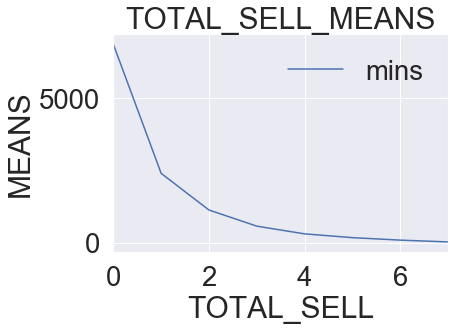

In [15]:
POPULARITY_mean.plot()
plt.title("TOTAL_SELL_MEANS")
plt.xlabel("TOTAL_SELL")
plt.ylabel("MEANS")
plt.show()

In [16]:
#인기도의 값이 여러개이기 때문에 범주를 만들어서 분석한다
#기준은 각 구간별의 mean의 값이다.
df_train['POPULARITY'] = np.where(df_train['POPULARITY'] <= 100, int('0'), df_train['POPULARITY'])
df_train['POPULARITY'] = np.where(df_train['POPULARITY'] > 7000, int('7'), df_train['POPULARITY'])
df_train['POPULARITY'] = np.where(df_train['POPULARITY'] > 2500, int('6'), df_train['POPULARITY'])
df_train['POPULARITY'] = np.where(df_train['POPULARITY'] > 1200, int('5'), df_train['POPULARITY'])
df_train['POPULARITY'] = np.where(df_train['POPULARITY'] > 650, int('4'), df_train['POPULARITY'])
df_train['POPULARITY'] = np.where(df_train['POPULARITY'] > 350, int('3'), df_train['POPULARITY'])
df_train['POPULARITY'] = np.where(df_train['POPULARITY'] > 200, int('2'), df_train['POPULARITY'])
df_train['POPULARITY'] = np.where(df_train['POPULARITY'] > 100, int('1'), df_train['POPULARITY'])

In [17]:
df_train[df_train['FIRST_PAGE'] == 1]['POPULARITY'].value_counts()

7.0    507
6.0    154
5.0     70
4.0     38
3.0     21
1.0      4
0.0      3
2.0      3
Name: POPULARITY, dtype: int64

In [18]:
#인기도 7.0의 0과 1의 분류를 보면 1 즉 첫번째 페이지에 더 많이 분포해 있는 것을 확인 할 수 있다.
pd.crosstab(df_train['POPULARITY'] , df_train['FIRST_PAGE'] , margins = True)

FIRST_PAGE,0,1,All
POPULARITY,,,
0.0,464,3,467
1.0,1085,4,1089
2.0,976,3,979
3.0,917,21,938
4.0,861,38,899
5.0,890,70,960
6.0,806,154,960
7.0,483,507,990
All,6482,800,7282


### 2. 장바구니와 랭킹 사이의 관계

In [19]:
#장바구니의 범주를 설정하기 위해 전체를 8등분한다
df_train_BUCKET = df_train.sort_values(['BUCKET'], ascending = False)
BUCKET_min = pd.DataFrame(data=[df_train_BUCKET['BUCKET'][0:1000].min(),df_train_BUCKET['BUCKET'][1001:2000].min(),df_train_BUCKET['BUCKET'][2001:3000].min(),df_train_BUCKET['BUCKET'][3001:4000].min(),df_train_BUCKET['BUCKET'][4001:5000].min(),df_train_BUCKET['BUCKET'][5001:6000].min(),df_train_BUCKET['BUCKET'][6001:7000].min(),df_train_BUCKET['BUCKET'][7001:].min()], index=range(0,8), columns=['mins'])
display(pd.DataFrame(BUCKET_min))

,mins
0,705.0
1,260.0
2,149.0
3,99.0
4,68.0
5,45.0
6,22.0
7,5.0


In [20]:
#인기도의 값이 여러개이기 때문에 범주를 만들어서 분석한다
#기준은 각 구간별의 min의 값이다.
df_train['BUCKET'] = np.where(df_train['BUCKET'] <= 10, int('0'), df_train['BUCKET'])
df_train['BUCKET'] = np.where(df_train['BUCKET'] > 700, int('7'), df_train['BUCKET'])
df_train['BUCKET'] = np.where(df_train['BUCKET'] > 250, int('6'), df_train['BUCKET'])
df_train['BUCKET'] = np.where(df_train['BUCKET'] > 150, int('5'), df_train['BUCKET'])
df_train['BUCKET'] = np.where(df_train['BUCKET'] > 100, int('4'), df_train['BUCKET'])
df_train['BUCKET'] = np.where(df_train['BUCKET'] > 70, int('3'), df_train['BUCKET'])
df_train['BUCKET'] = np.where(df_train['BUCKET'] > 50, int('2'), df_train['BUCKET'])
df_train['BUCKET'] = np.where(df_train['BUCKET'] > 10, int('1'), df_train['BUCKET'])

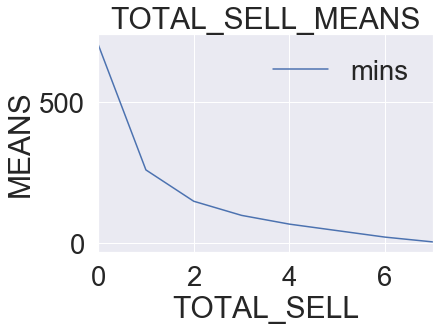

In [21]:
BUCKET_min.plot()
plt.title("TOTAL_SELL_MEANS")
plt.xlabel("TOTAL_SELL")
plt.ylabel("MEANS")
plt.show()

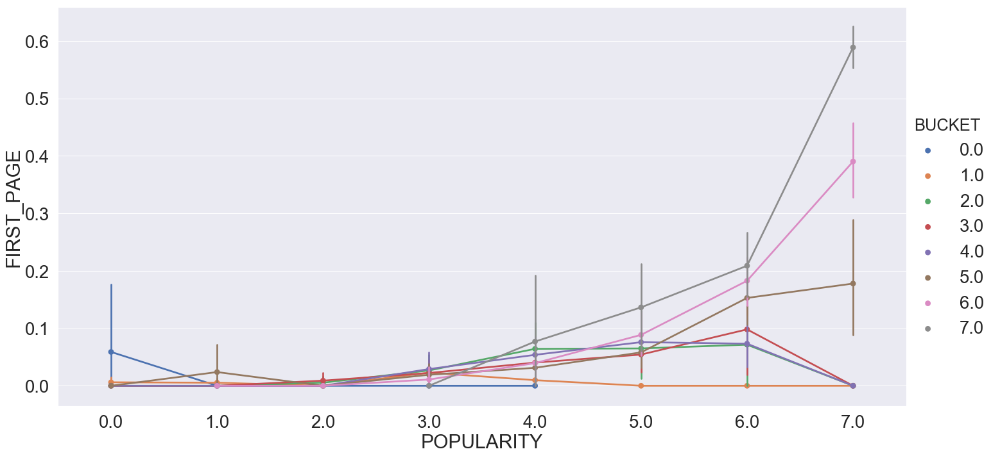

In [22]:
#장바구니 갯수에 대한 범주값 별로 FIRST_PAGE컬럼과 POPULARITY컬럼을 교차해서 그래프를 그림
sns.factorplot('POPULARITY' , 'FIRST_PAGE' , hue = 'BUCKET', data = df_train,size=10,aspect=2)

### 3. 좋아요 갯수와 랭킹 사이의 관계

In [23]:
#좋아요 갯수의 범주를 설정하기 위해 전체를 8등분한다
df_train_LIKE = df_train.sort_values(['LIKE_'], ascending = False)
LIKE_min = pd.DataFrame(data=[df_train_LIKE['LIKE_'][0:1000].min(),df_train_LIKE['LIKE_'][1001:2000].min(),df_train_LIKE['LIKE_'][2001:3000].min(),df_train_LIKE['LIKE_'][3001:4000].min(),df_train_LIKE['LIKE_'][4001:5000].min(),df_train_LIKE['LIKE_'][5001:6000].min(),df_train_LIKE['LIKE_'][6001:7000].min(),df_train_LIKE['LIKE_'][7001:].min()], index=range(0,8), columns=['mins'])
display(pd.DataFrame(LIKE_min))

,mins
0,451.0
1,174.0
2,103.0
3,69.0
4,47.0
5,31.0
6,14.0
7,0.0


In [24]:
#좋아요의 값이 여러개이기 때문에 범주를 만들어서 분석한다
#기준은 각 구간별의 mean의 값이다.
df_train['LIKE_'] = np.where(df_train['LIKE_'] <= 20, int('0'), df_train['LIKE_'])
df_train['LIKE_'] = np.where(df_train['LIKE_'] > 450, int('7'), df_train['LIKE_'])
df_train['LIKE_'] = np.where(df_train['LIKE_'] > 200, int('6'), df_train['LIKE_'])
df_train['LIKE_'] = np.where(df_train['LIKE_'] > 100, int('5'), df_train['LIKE_'])
df_train['LIKE_'] = np.where(df_train['LIKE_'] > 70, int('4'), df_train['LIKE_'])
df_train['LIKE_'] = np.where(df_train['LIKE_'] > 50, int('3'), df_train['LIKE_'])
df_train['LIKE_'] = np.where(df_train['LIKE_'] > 35, int('2'), df_train['LIKE_'])
df_train['LIKE_'] = np.where(df_train['LIKE_'] > 20, int('1'), df_train['LIKE_'])

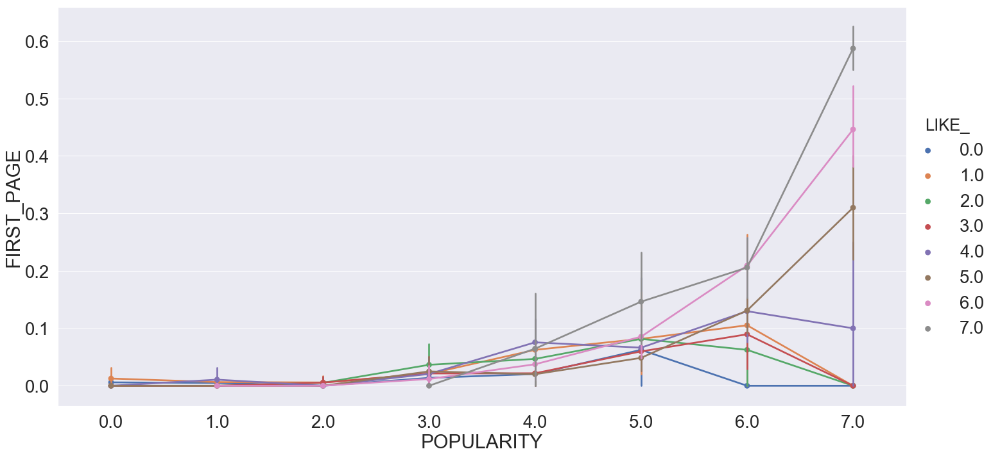

In [25]:
#장바구니 갯수에 대한 범주값 별로 FIRST_PAGE컬럼과 POPULARITY컬럼을 교차해서 그래프를 그림
sns.factorplot('POPULARITY' , 'FIRST_PAGE' , hue = 'LIKE_', data = df_train,size=10,aspect=2)

### 4. 누적판매량과 랭킹 사이의 관계

In [26]:
##총판매량의 범주를 설정하기 위해 전체를 8등분한다
df_train_TOTAL_SELL = df_train.sort_values(['TOTAL_SELL'], ascending = False)
TOTAL_SELL_min = pd.DataFrame(data=[df_train_TOTAL_SELL['TOTAL_SELL'][0:1000].min(),df_train_TOTAL_SELL['TOTAL_SELL'][1001:2000].min(),df_train_TOTAL_SELL['TOTAL_SELL'][2001:3000].min(),df_train_TOTAL_SELL['TOTAL_SELL'][3001:4000].min(),df_train_TOTAL_SELL['TOTAL_SELL'][4001:5000].min(),df_train_TOTAL_SELL['TOTAL_SELL'][5001:6000].min(),df_train_TOTAL_SELL['TOTAL_SELL'][6001:7000].min(),df_train_TOTAL_SELL['TOTAL_SELL'][7001:].min()], index=range(0,8), columns=['mins'])
display(pd.DataFrame(TOTAL_SELL_min))

,mins
0,383.0
1,89.0
2,43.0
3,27.0
4,18.0
5,14.0
6,10.0
7,10.0


In [27]:
#총판매량의 값이 여러개이기 때문에 범주를 만들어서 분석한다
df_train['TOTAL_SELL'] = np.where(df_train['TOTAL_SELL'] <= 10, int('0'), df_train['TOTAL_SELL'])
df_train['TOTAL_SELL'] = np.where(df_train['TOTAL_SELL'] > 380, int('7'), df_train['TOTAL_SELL'])
df_train['TOTAL_SELL'] = np.where(df_train['TOTAL_SELL'] > 90, int('6'), df_train['TOTAL_SELL'])
df_train['TOTAL_SELL'] = np.where(df_train['TOTAL_SELL'] > 40, int('5'), df_train['TOTAL_SELL'])
df_train['TOTAL_SELL'] = np.where(df_train['TOTAL_SELL'] > 30, int('4'), df_train['TOTAL_SELL'])
df_train['TOTAL_SELL'] = np.where(df_train['TOTAL_SELL'] > 20, int('3'), df_train['TOTAL_SELL'])
df_train['TOTAL_SELL'] = np.where(df_train['TOTAL_SELL'] > 15, int('2'), df_train['TOTAL_SELL'])
df_train['TOTAL_SELL'] = np.where(df_train['TOTAL_SELL'] > 10, int('1'), df_train['TOTAL_SELL'])

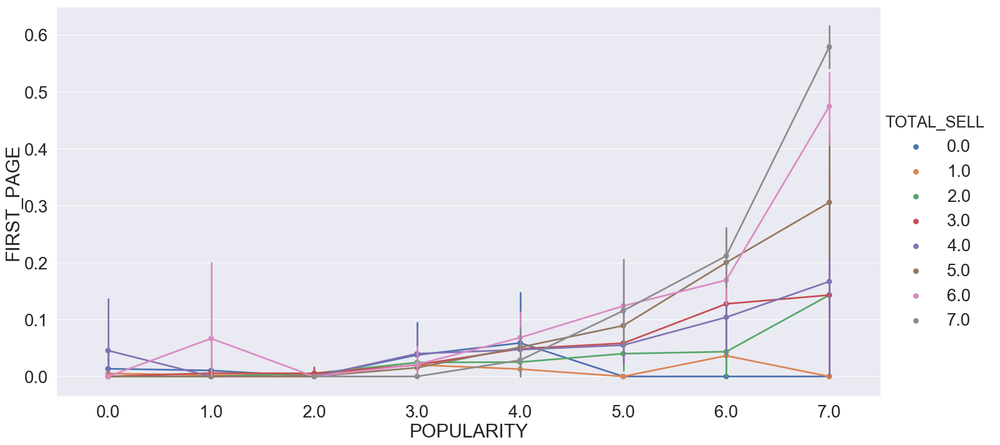

In [28]:
sns.factorplot('POPULARITY' , 'FIRST_PAGE' , hue = 'TOTAL_SELL', data = df_train,size=10,aspect=2)

### 5. 만족도와 랭킹 사이의 관계

In [29]:
# Satisfaction 컬럼의 빈도수 조회
df_train['SATISFACTION'].value_counts()

100.0    1143
93.0      791
90.0      595
95.0      594
94.0      495
92.0      482
80.0      425
96.0      411
91.0      362
97.0      260
87.0      257
88.0      237
98.0      224
89.0      200
85.0      153
84.0      103
86.0       84
83.0       73
60.0       71
70.0       51
73.0       41
99.0       38
82.0       33
76.0       21
75.0       21
78.0       18
77.0       17
67.0       12
40.0        9
72.0        9
74.0        8
81.0        7
65.0        6
68.0        5
20.0        4
79.0        4
64.0        3
53.0        3
50.0        3
71.0        2
47.0        2
66.0        2
69.0        2
56.0        1
Name: SATISFACTION, dtype: int64

In [30]:
df_train[df_train['FIRST_PAGE'] == 1]['SATISFACTION'].value_counts()

94.0     125
95.0     114
93.0     107
92.0      82
96.0      68
91.0      60
90.0      47
97.0      38
100.0     36
98.0      24
89.0      21
88.0      19
80.0      16
85.0       8
87.0       8
99.0       7
86.0       5
83.0       3
82.0       3
60.0       2
84.0       2
81.0       2
73.0       1
72.0       1
78.0       1
Name: SATISFACTION, dtype: int64

In [31]:
df_train[df_train['FIRST_PAGE'] == 0]['SATISFACTION'].value_counts()

100.0    1107
93.0      684
90.0      548
95.0      480
80.0      409
92.0      400
94.0      370
96.0      343
91.0      302
87.0      249
97.0      222
88.0      218
98.0      200
89.0      179
85.0      145
84.0      101
86.0       79
83.0       70
60.0       69
70.0       51
73.0       40
99.0       31
82.0       30
75.0       21
76.0       21
78.0       17
77.0       17
67.0       12
40.0        9
74.0        8
72.0        8
65.0        6
68.0        5
81.0        5
20.0        4
79.0        4
50.0        3
64.0        3
53.0        3
69.0        2
71.0        2
66.0        2
47.0        2
56.0        1
Name: SATISFACTION, dtype: int64

In [32]:
# satisfaction 컬럼에서 랭킹 지수 first_page=1인 줄 대입
high_ranking = df_train['SATISFACTION'][df_train['FIRST_PAGE'] == 1]
high_ranking

0        94.0
1        95.0
2        94.0
3        96.0
4        95.0
6        95.0
7        92.0
9        93.0
10       92.0
11       85.0
13       96.0
14       94.0
15       94.0
16       96.0
17       89.0
19       95.0
21       93.0
23       93.0
24       94.0
25       92.0
26       94.0
27      100.0
29       92.0
31       98.0
32       95.0
33       96.0
34       94.0
35       96.0
36       96.0
37       96.0
        ...  
1343     93.0
1347     92.0
1348     91.0
1349     95.0
1350     95.0
1351     93.0
1352     91.0
1353     78.0
1354     95.0
1355     93.0
1357     94.0
1358     93.0
1359     94.0
1360     92.0
1361     90.0
1364     88.0
1365     91.0
1366     90.0
1367     90.0
1370     96.0
1371     95.0
1372    100.0
1373     94.0
1374     92.0
1377     98.0
1378     80.0
1379     92.0
1380     90.0
1381     93.0
1382     87.0
Name: SATISFACTION, Length: 800, dtype: float64

In [33]:
# satisfaction 컬럼에서 랭킹 지수 first_page=0인 줄 대입
low_ranking = df_train['SATISFACTION'][df_train['FIRST_PAGE'] == 0]
low_ranking

1383      94.0
1387      96.0
1388      94.0
1389      93.0
1390      93.0
1391      93.0
1396      93.0
1397      93.0
1398      93.0
1399      95.0
1400      95.0
1401      93.0
1402      89.0
1403      92.0
1404      88.0
1405      92.0
1406      94.0
1408      93.0
1410      95.0
1412      94.0
1416      92.0
1418      95.0
1419     100.0
1420      98.0
1421      92.0
1422      94.0
1423      91.0
1425      93.0
1428      83.0
1430     100.0
         ...  
49758     90.0
49760    100.0
49799    100.0
49801     93.0
49863    100.0
49878     90.0
49879     85.0
49930     75.0
49939     80.0
49957    100.0
49958     72.0
49960     60.0
49969    100.0
49980     90.0
49985     98.0
50000     93.0
50005     80.0
50030     95.0
50048     90.0
50082     87.0
50087     80.0
50098     80.0
50099     84.0
50100     93.0
50101     88.0
50107     80.0
50108    100.0
50114     92.0
50117     90.0
50125     95.0
Name: SATISFACTION, Length: 6482, dtype: float64

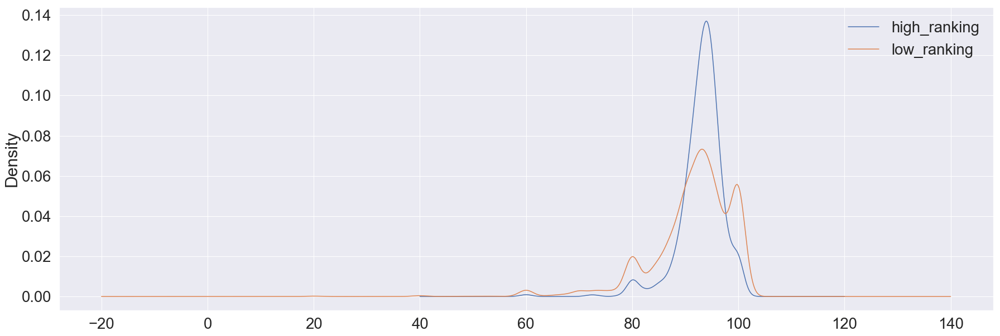

In [34]:
# satisfaction 컬럼에서 각 만족도 별 high_ranking과  low_ranking 비율을 그래프로 그려보자
plt.figure(figsize=(30,10))
high_ranking.plot(kind='kde')
low_ranking.plot(kind='kde')
plt.legend(['high_ranking', 'low_ranking'])

- 높낮이를 보면, 낮은 랭킹에 비해 높은 랭킹에서 만족도가 특정 범위에 뚜렷하게 집중되어 있는 것을 볼 수 있다. 
- 또, 그래프 모양을 봤을 때 low_ranking보다 high_ranking의 축이 더 오른쪽에 치우쳐져 있는 것을 볼 수 있다. 이는 랭킹이 높은 상품의 만족도가 낮은 랭킹의 상품들보다 높다는 것을 보여준다.

### 6. 배송 소요 시간과 랭킹 사이의 관계

In [35]:
# 각 배송일 별 상품의 수 조회
df_train['DELIVERY_DATE'].value_counts()

2.0     5561
1.0      976
3.0      577
4.0      123
5.0       17
7.0       12
6.0        7
12.0       6
9.0        2
8.0        1
Name: DELIVERY_DATE, dtype: int64

In [36]:
# 높은 랭킹의 상품들 중 배송일이 빠른 순서로 데이터프레임화 시킨다. 
df_temp = df_train[df_train['FIRST_PAGE'] == 1]['DELIVERY_DATE'].value_counts()
df_delivery_high = pd.DataFrame({'delivery_date':df_temp.index, 'frequency':df_temp.values})
df_delivery_high.sort_values('delivery_date', ascending=True)

,delivery_date,frequency
2,1.0,31
0,2.0,667
1,3.0,64
3,4.0,30
4,7.0,3
6,9.0,2
5,12.0,3


In [37]:
# 낮은 랭킹의 상품들 중 배송일이 빠른 순서로 데이터프레임화 시킨다. 
df_temp = df_train[df_train['FIRST_PAGE'] == 0]['DELIVERY_DATE'].value_counts()
df_delivery_low = pd.DataFrame({'delivery_date':df_temp.index, 'frequency':df_temp.values})
df_delivery_low.sort_values('delivery_date', ascending=True)

,delivery_date,frequency
1,1.0,945
0,2.0,4894
2,3.0,513
3,4.0,93
4,5.0,17
6,6.0,7
5,7.0,9
8,8.0,1
7,12.0,3


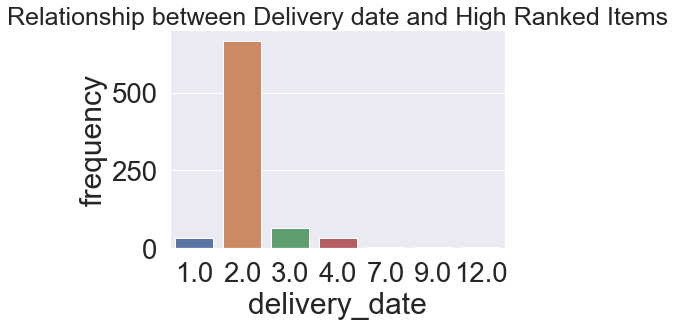

In [38]:
# 배송일 별 높은 랭킹의 상품들 분포도
sns.barplot(x='delivery_date', y='frequency', data=df_delivery_high, dodge=False)
plt.title('Relationship between Delivery date and High Ranked Items', fontsize='25')
plt.show()

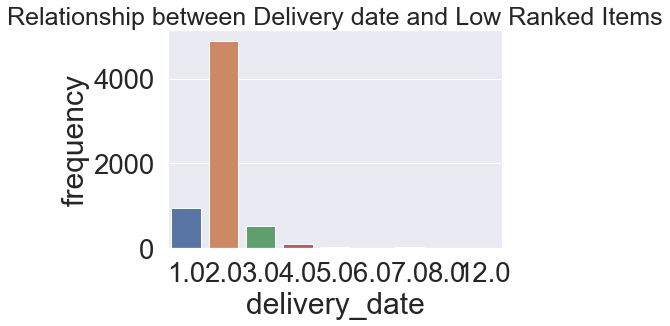

In [39]:
# 배송일 별 낮은 랭킹의 상품 분포도
sns.barplot(x='delivery_date', y='frequency', data=df_delivery_low, dodge=False)
plt.title('Relationship between Delivery date and Low Ranked Items', fontsize='25')
plt.show()

- 두 그래프를 비교해보면, 랭킹의 높고 낮음에 상관없이 배송일이 2일일 경우에 가장 많은 상품들이 군집되어 있고, 1일 혹은 3일이 소요되는 상품들이 큰 격차를 두고 분포함을 알 수 있다. 
- 이는 배송일이 랭킹의 높고 낮음에 큰 영향을 미치지 않음을 의미하므로, 해당 데이터는 x값에서 제외시키도록 한다.

### 7. 가격과 랭킹 사이의 관계

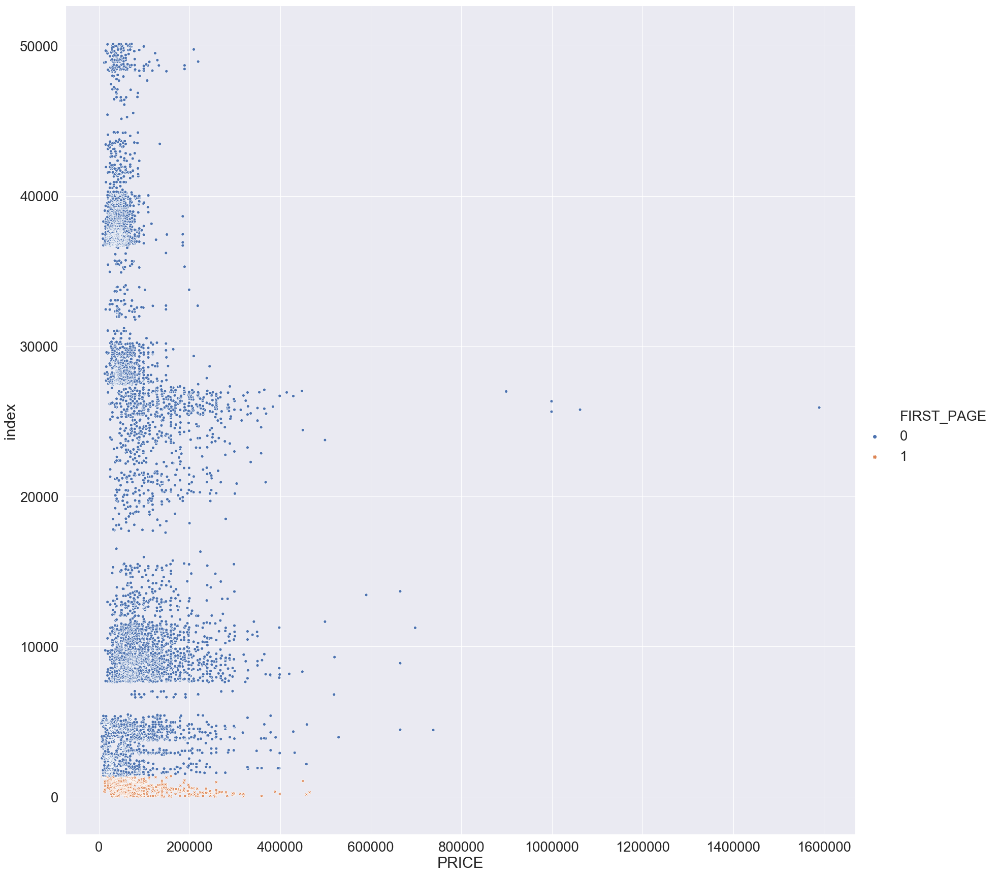

In [40]:
sns.relplot(x="PRICE", y="index", hue="FIRST_PAGE", style="FIRST_PAGE", data=df_train, height=24, aspect=1)

In [41]:
df_train_PRICE = df_train.copy()
df_train_PRICE = df_train_PRICE.drop(['TITLE', 'BRAND', 'SEX', 'CATEGORY_', 'POPULARITY','BUCKET', 'TOTAL_SELL', 'LIKE_', 'SATISFACTION', 'DELIVERY_DATE', 'SALE', 'IMG_URL'], axis=1)
df_train_PRICE

,index,REVIEW,PRICE,FIRST_PAGE
0,0,8845.0,31900.0,1
1,1,2441.0,256800.0,1
2,2,8960.0,86400.0,1
3,3,909.0,159500.0,1
4,4,611.0,139000.0,1
6,6,1703.0,143900.0,1
7,7,27760.0,32760.0,1
9,9,2249.0,57900.0,1
10,10,863.0,62000.0,1
11,11,669.0,158400.0,1


In [42]:
# 가격의 범주를 만들어서 분석한다, 기준은 각 구간별의 max의 값이다.
df_train_PRICE['PRICE'] = np.where(df_train_PRICE['PRICE']<=50000, int('0'), df_train_PRICE['PRICE'])
df_train_PRICE['PRICE'] = np.where(df_train_PRICE['PRICE']>50000, int('1'), df_train_PRICE['PRICE'])
df_train_PRICE['PRICE'] = np.where(df_train_PRICE['PRICE']>100000, int('2'), df_train_PRICE['PRICE'])
df_train_PRICE['PRICE'] = np.where(df_train_PRICE['PRICE']>200000, int('3'), df_train_PRICE['PRICE'])
df_train_PRICE['PRICE'] = np.where(df_train_PRICE['PRICE']>500000, int('4'), df_train_PRICE['PRICE'])
df_train_PRICE

,index,REVIEW,PRICE,FIRST_PAGE
0,0,8845.0,0.0,1
1,1,2441.0,1.0,1
2,2,8960.0,1.0,1
3,3,909.0,1.0,1
4,4,611.0,1.0,1
6,6,1703.0,1.0,1
7,7,27760.0,0.0,1
9,9,2249.0,1.0,1
10,10,863.0,1.0,1
11,11,669.0,1.0,1


In [43]:
# 상위랭크의 상품들을 집중해서 보자
#sns.factorplot(x="price", y="frequency", hue="rank", data=df_train_PRICE, height=24, aspect=1)

- 주황색으로 표시된 점들이 상위랭킹 상품들, 파란색 점들이 하위랭킹 상품들이다. 상위랭킹 상품들의 분포를 집중적으로 볼 때, 모든 상품의 가격대가 50만원 미만으로 형성되어 있으며, 특히 10만원 미만의 가격대에 상품이 몰려있음을 알 수 있다. 

### 리뷰와 랭킹 사이의 관계

In [44]:
df_train_sort_REVIEW = df_train.sort_values('REVIEW' , ascending=False)

#장바구니의 범주를 설정하기 위해 전체를 8등분한다
df_train_REVIEW = df_train_sort_REVIEW.sort_values(['REVIEW'], ascending = False)
REVIEW_min = pd.DataFrame(data=[df_train_REVIEW['REVIEW'][0:1000].min(),df_train_REVIEW['REVIEW'][1001:2000].min(),df_train_REVIEW['REVIEW'][2001:3000].min(),df_train_REVIEW['REVIEW'][3001:4000].min(),df_train_REVIEW['REVIEW'][4001:5000].min(),df_train_REVIEW['REVIEW'][5001:6000].min(),df_train_REVIEW['REVIEW'][6001:7000].min(),df_train_REVIEW['REVIEW'][7001:].min()], index=range(0,8), columns=['mins'])
display(pd.DataFrame(REVIEW_min))

,mins
0,421.0
1,67.0
2,29.0
3,15.0
4,8.0
5,4.0
6,1.0
7,1.0


In [45]:
df_train['REVIEW'] = np.where(df_train['REVIEW'] <= 5, int('0'), df_train['REVIEW'])
df_train['REVIEW'] = np.where(df_train['REVIEW'] > 421, int('7'), df_train['REVIEW'])
df_train['REVIEW'] = np.where(df_train['REVIEW'] > 67, int('6'), df_train['REVIEW'])
df_train['REVIEW'] = np.where(df_train['REVIEW'] > 29 , int('5'), df_train['REVIEW'])
df_train['REVIEW'] = np.where(df_train['REVIEW'] > 15, int('4'), df_train['REVIEW'])
df_train['REVIEW'] = np.where(df_train['REVIEW'] > 8, int('3'), df_train['REVIEW'])
df_train

,index,TITLE,BRAND,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL,FIRST_PAGE
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,남,7.0,7.0,7.0,7.0,7.0,94.0,2.0,31900.0,0.0,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...,1
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,남,7.0,7.0,7.0,7.0,7.0,95.0,2.0,256800.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...,1
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,남,7.0,7.0,7.0,7.0,7.0,94.0,2.0,86400.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...,1
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,라이프,7.0,7.0,7.0,7.0,7.0,96.0,2.0,159500.0,0.0,이어폰,https://image.msscdn.net/images/goods_img/2019...,1
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,남,7.0,7.0,7.0,7.0,7.0,95.0,2.0,139000.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...,1
6,6,캐시미어 블렌드 오버사이즈 더블 코트 [블랙]|CASHMERE BLEND OVERS...,MUSINSA STANDARD,남,7.0,7.0,7.0,7.0,7.0,95.0,2.0,143900.0,10.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2018...,1
7,7,[세트] 하프 폴라 니트 티셔츠|[SET] Half Pola Knit T-Shirt,ESN,남,7.0,7.0,7.0,7.0,7.0,92.0,2.0,32760.0,58.0,니트/스웨터/카디건,https://image.msscdn.net/images/goods_img/2017...,1
9,9,[무신사 단독특가] FW 미니멀 스탠다드 카고조거 슬랙스|[무신사 단독특가] FW ...,SEVENSELAH,남,7.0,7.0,7.0,7.0,7.0,93.0,2.0,57900.0,35.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...,1
10,10,CARGO STRING PANTS _ BLACK|CARGO STRING PANTS ...,FRIZMWORKS,남,7.0,7.0,7.0,7.0,7.0,92.0,3.0,62000.0,0.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...,1
11,11,12/19 배송 오버사이즈 무스탕 자켓 [GREYISH BEIGE]|OVERSIZE...,DRAW FIT,남,7.0,7.0,7.0,7.0,7.0,85.0,2.0,158400.0,20.0,레더/라이더스 재킷,https://image.msscdn.net/images/goods_img/2019...,1


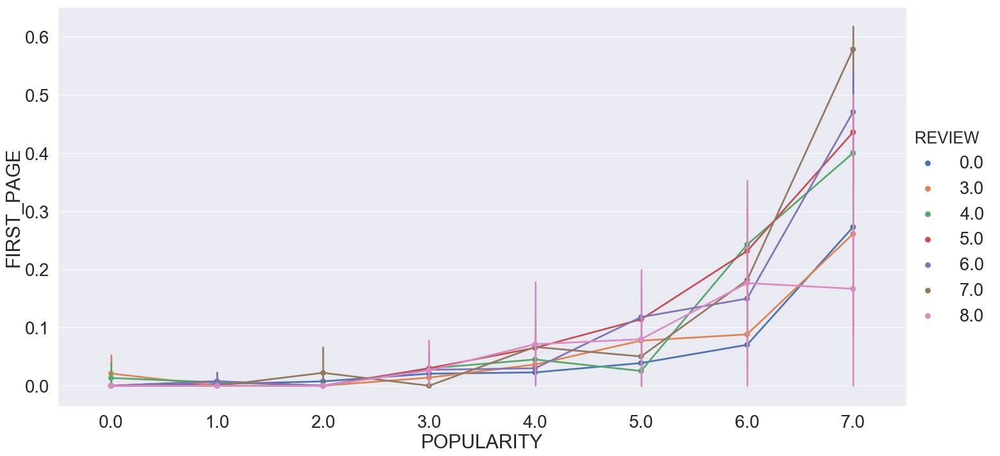

In [46]:
sns.factorplot('POPULARITY' , 'FIRST_PAGE' , hue = 'REVIEW', data = df_train,size=10,aspect=2)

### 8. 할인률과 랭킹 사이의 관계

In [47]:
df_train['SALE'].value_counts()

0.0     2761
30.0     773
20.0     721
10.0     602
50.0     379
40.0     327
15.0     141
60.0     132
25.0     115
70.0      75
5.0       64
35.0      60
41.0      56
33.0      44
45.0      41
29.0      38
57.0      37
21.0      36
31.0      36
34.0      31
22.0      29
13.0      26
43.0      25
37.0      25
49.0      24
56.0      23
27.0      22
36.0      22
24.0      22
17.0      21
        ... 
58.0      12
63.0      11
12.0      11
46.0      11
67.0      11
47.0      10
73.0       9
71.0       9
7.0        8
69.0       7
72.0       7
80.0       7
53.0       7
9.0        7
74.0       7
8.0        7
75.0       6
79.0       4
82.0       4
68.0       3
86.0       3
84.0       2
83.0       2
76.0       1
87.0       1
78.0       1
3.0        1
4.0        1
90.0       1
85.0       1
Name: SALE, Length: 84, dtype: int64

In [48]:
df_train_SALE = df_train.copy()
df_train_SALE = df_train_SALE.sort_values(['SALE'], ascending = False)
df_train_SALE

,index,TITLE,BRAND,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL,FIRST_PAGE
2764,2764,T37F HOODIE HIGHNECK JUMPER (DARK GREEN)|T37F ...,TRYTOTALK,남,3.0,2.0,1.0,2.0,0.0,80.0,2.0,14500.0,90.0,기타,https://image.msscdn.net/images/goods_img/2017...,0
11034,11034,버드 스카잔 KJP6701|버드 스카잔 KJP6701,KONUS,남,5.0,4.0,5.0,4.0,4.0,88.0,2.0,52000.0,87.0,블루종/MA-1,https://image.msscdn.net/images/goods_img/2019...,0
3993,3993,Ltu Hood (U17DTHD62)|Ltu Hood (U17DTHD62),UNLIMIT,남,7.0,7.0,7.0,7.0,6.0,85.0,2.0,10000.0,86.0,후드 스웨트셔츠/후드 집업,https://image.msscdn.net/images/goods_img/2017...,0
9043,9043,봄버 점퍼 WWO8499|봄버 점퍼 WWO8499,KONUS,남,4.0,2.0,1.0,1.0,0.0,87.0,2.0,77000.0,86.0,블루종/MA-1,https://image.msscdn.net/images/goods_img/2019...,0
26189,26189,패딩 셔츠 KSL6O01_BK|패딩 셔츠 KSL6O01_BK,KONUS,남,5.0,3.0,2.0,2.0,0.0,100.0,2.0,39000.0,86.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...,0
19685,19685,베이직봄버자켓 KDN6O07_NV|베이직봄버자켓 KDN6O07_NV,KONUS,남,5.0,1.0,1.0,0.0,0.0,60.0,2.0,89000.0,85.0,롱 패딩/롱 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...,0
11039,11039,셔츠 자켓 KSL6901|셔츠 자켓 KSL6901,KONUS,여,3.0,1.0,1.0,0.0,0.0,90.0,2.0,37000.0,84.0,기타,https://image.msscdn.net/images/goods_img/2019...,0
4933,4933,G-1 Jacket (U17DTJK43)|G-1 Jacket (U17DTJK43),UNLIMIT,남,6.0,6.0,6.0,6.0,6.0,86.0,2.0,20000.0,84.0,블루종/MA-1,https://image.msscdn.net/images/goods_img/2017...,0
4870,4870,Short Padding (U17DTJK42)|Short Padding (U17DT...,UNLIMIT,남,7.0,7.0,6.0,7.0,6.0,89.0,2.0,20000.0,83.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2017...,0
9260,9260,V넥 지퍼 경량 베스트 (BK)|V넥 지퍼 경량 베스트 (BK),R ZIOZIA,남,5.0,1.0,4.0,0.0,3.0,100.0,2.0,33000.0,83.0,패딩 베스트,https://image.msscdn.net/images/goods_img/2019...,0


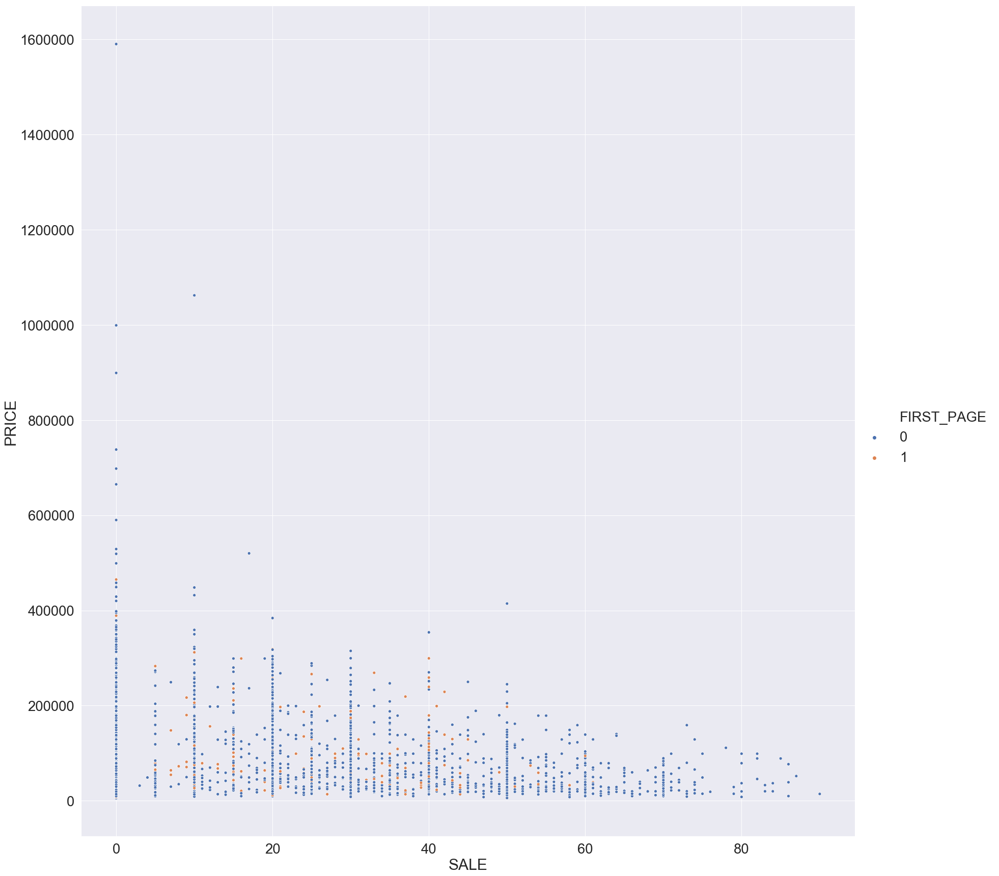

In [49]:
sns.relplot('SALE', 'PRICE', hue='FIRST_PAGE', data = df_train_SALE, height=24, aspect=1)

In [50]:
# satisfaction 컬럼에서 랭킹 지수 first_page=1인 줄 대입
high_ranking = df_train['SALE'][df_train['FIRST_PAGE'] == 1]
high_ranking

0        0.0
1       20.0
2       10.0
3        0.0
4       30.0
6       10.0
7       58.0
9       35.0
10       0.0
11      20.0
13       0.0
14       0.0
15       0.0
16      20.0
17      20.0
19      10.0
21      49.0
23      10.0
24      26.0
25      10.0
26       0.0
27      20.0
29      50.0
31       0.0
32       0.0
33      50.0
34       0.0
35       0.0
36       0.0
37       0.0
        ... 
1343    30.0
1347     0.0
1348    20.0
1349    20.0
1350     0.0
1351     0.0
1352     0.0
1353     0.0
1354     0.0
1355     0.0
1357    10.0
1358    10.0
1359    10.0
1360    10.0
1361    30.0
1364    19.0
1365     0.0
1366     0.0
1367     0.0
1370     0.0
1371    19.0
1372     0.0
1373     0.0
1374    39.0
1377     0.0
1378    50.0
1379     0.0
1380     0.0
1381     0.0
1382    10.0
Name: SALE, Length: 800, dtype: float64

In [51]:
# satisfaction 컬럼에서 랭킹 지수 first_page=0인 줄 대입
low_ranking = df_train['SALE'][df_train['FIRST_PAGE'] == 0]
low_ranking

1383      0.0
1387     30.0
1388     30.0
1389     28.0
1390     40.0
1391      0.0
1396     20.0
1397     20.0
1398     20.0
1399     25.0
1400     10.0
1401      0.0
1402      0.0
1403     30.0
1404     12.0
1405      0.0
1406     23.0
1408      0.0
1410     29.0
1412     10.0
1416     30.0
1418     20.0
1419      0.0
1420      0.0
1421     66.0
1422     66.0
1423     31.0
1425     72.0
1428     20.0
1430      0.0
         ... 
49758    30.0
49760    30.0
49799    22.0
49801     0.0
49863    15.0
49878    50.0
49879     0.0
49930     0.0
49939     0.0
49957    20.0
49958     0.0
49960    40.0
49969     0.0
49980     5.0
49985    40.0
50000    20.0
50005    30.0
50030    20.0
50048     0.0
50082    63.0
50087    50.0
50098    30.0
50099    46.0
50100    30.0
50101     0.0
50107    30.0
50108    20.0
50114    40.0
50117    20.0
50125     0.0
Name: SALE, Length: 6482, dtype: float64

- 위의 결과에서 알 수 있듯이, 

### 9. 상관관계 파악

In [52]:
df_train.corr()["FIRST_PAGE"]

index           -0.370925
POPULARITY       0.417064
BUCKET           0.386877
TOTAL_SELL       0.370096
LIKE_            0.361627
REVIEW           0.241491
SATISFACTION     0.068391
DELIVERY_DATE    0.093810
PRICE            0.048077
SALE            -0.074335
FIRST_PAGE       1.000000
Name: FIRST_PAGE, dtype: float64

- 범주화시켜서 진행한 상위 4개의 카테고리가 랭킹을 정하는 데에 큰 영향을 미친다는 것을 알 수 있다.

### 10. 컬럼 별 기울기 정보 파악

In [53]:
df_train.skew()

index            0.677129
POPULARITY      -0.011409
BUCKET           0.037079
TOTAL_SELL       0.010263
LIKE_           -0.092636
REVIEW          -0.466309
SATISFACTION    -2.215487
DELIVERY_DATE    4.328075
PRICE            3.872179
SALE             0.780524
FIRST_PAGE       2.495693
dtype: float64

- 사용하지 않을 컬럼 satisfaction과 delivery_date를 제외하고, 가장 기울어진 컬럼인 PRICE에 대해 정제해보기로 한다.

(array([6.433e+03, 7.600e+02, 7.300e+01, 6.000e+00, 5.000e+00, 1.000e+00,
        3.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([   5000.,  163500.,  322000.,  480500.,  639000.,  797500.,
         956000., 1114500., 1273000., 1431500., 1590000.]),
 <a list of 10 Patch objects>)

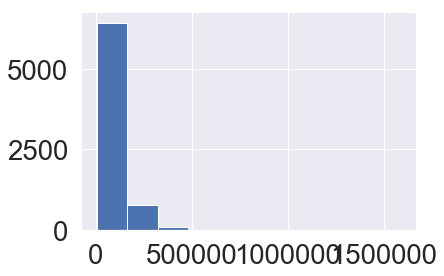

In [54]:
# 기울기가 가장 높은 컬럼 시각화
plt.hist(df_train["PRICE"])

(array([  13.,  262.,  757., 1804., 2212., 1303.,  777.,  140.,    9.,
           5.]),
 array([ 8.51739317,  9.09357837,  9.66976358, 10.24594878, 10.82213398,
        11.39831919, 11.97450439, 12.55068959, 13.1268748 , 13.70306   ,
        14.2792452 ]),
 <a list of 10 Patch objects>)

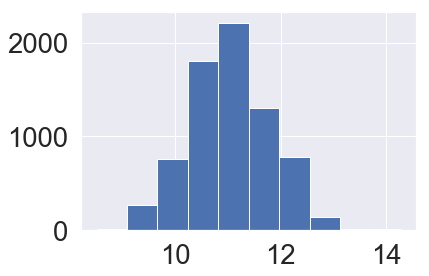

In [55]:
# price에 log(1+y값)을 취한 값 리턴하는 함수 호출해 price 컬럼에 대입한다.
df_train["PRICE"]=np.log1p(df_train["PRICE"])
plt.hist(df_train["PRICE"])

# 데이터 전처리

### 1. 새로운 컬럼 추가

- 기존에 존재하던 데이터에 **FIRST_PAGE** 칼럼을 만들어 y값 즉 타겟값을 잡았습니다

### 2. 범주형 데이터 처리

In [56]:
df_train_sort_PRICE = df_train.sort_values('PRICE' , ascending=False)

#장바구니의 범주를 설정하기 위해 전체를 8등분한다
df_train_PRICE = df_train_sort_PRICE.sort_values(['PRICE'], ascending = False)
PRICE_min = pd.DataFrame(data=[df_train_PRICE['PRICE'][0:1000].min(),df_train_PRICE['PRICE'][1001:2000].min(),df_train_PRICE['PRICE'][2001:3000].min(),df_train_PRICE['PRICE'][3001:4000].min(),df_train_PRICE['PRICE'][4001:5000].min(),df_train_PRICE['PRICE'][5001:6000].min(),df_train_PRICE['PRICE'][6001:7000].min(),df_train_PRICE['PRICE'][7001:].min()], index=range(0,8), columns=['mins'])
display(pd.DataFrame(PRICE_min))

,mins
0,11.926365
1,11.501875
2,11.198228
3,10.985310
4,10.689692
5,10.348205
6,9.674137
7,8.517393


- 각 구간별의 min값으로 번주 기준을 잡았습니다 

In [57]:
#옷 가격의 값이 여러개이기 때문에 범주를 만들어서 분석한다
df_train['PRICE'] = np.where(df_train['PRICE'] <= 8.517393, int('0'), df_train['PRICE'])
df_train['PRICE'] = np.where(df_train['PRICE'] > 11.970357, int('7'), df_train['PRICE'])
df_train['PRICE'] = np.where(df_train['PRICE'] > 11.502885, int('6'), df_train['PRICE'])
df_train['PRICE'] = np.where(df_train['PRICE'] > 11.250274, int('5'), df_train['PRICE'])
df_train['PRICE'] = np.where(df_train['PRICE'] > 10.778977, int('4'), df_train['PRICE'])
df_train['PRICE'] = np.where(df_train['PRICE'] > 10.474495, int('3'), df_train['PRICE'])
df_train['PRICE'] = np.where(df_train['PRICE'] > 10.077483, int('2'), df_train['PRICE'])
df_train['PRICE'] = np.where(df_train['PRICE'] > 8.517393, int('1'), df_train['PRICE'])

### 3. 컬럼 삭제

In [58]:
df_train

,index,TITLE,BRAND,SEX,POPULARITY,BUCKET,TOTAL_SELL,LIKE_,REVIEW,SATISFACTION,DELIVERY_DATE,PRICE,SALE,CATEGORY_,IMG_URL,FIRST_PAGE
0,0,테이퍼드 히든 밴딩 크롭 슬랙스 [블랙]|TAPERED HIDDEN BANDING ...,MUSINSA STANDARD,남,7.0,7.0,7.0,7.0,7.0,94.0,2.0,2.0,0.0,수트 팬츠/슬랙스,https://image.msscdn.net/images/goods_img/2019...,1
1,1,12/26 배송 캐시미어20 오버핏 더블 롱 코트 (블랙)|캐시미어20 오버핏 더블...,COOR,남,7.0,7.0,7.0,7.0,7.0,95.0,2.0,7.0,20.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2017...,1
2,2,Tydi crop jeans #0064|Tydi crop jeans #0064,FATALISM,남,7.0,7.0,7.0,7.0,7.0,94.0,2.0,5.0,10.0,데님 팬츠,https://image.msscdn.net/images/goods_img/2017...,1
3,3,삼성 블루투스 이어폰 갤럭시버즈 SM-R170|삼성 블루투스 이어폰 갤럭시버즈 SM...,SAMSUNG ELECTRONICS,라이프,7.0,7.0,7.0,7.0,7.0,96.0,2.0,7.0,0.0,이어폰,https://image.msscdn.net/images/goods_img/2019...,1
4,4,공용 알래스카 에어 프리미엄 푸퍼 점퍼 _ PHZ4JP3220GR|공용 알래스카 에...,POLHAM,남,7.0,7.0,7.0,7.0,7.0,95.0,2.0,6.0,30.0,숏 패딩/숏 헤비 아우터,https://image.msscdn.net/images/goods_img/2019...,1
6,6,캐시미어 블렌드 오버사이즈 더블 코트 [블랙]|CASHMERE BLEND OVERS...,MUSINSA STANDARD,남,7.0,7.0,7.0,7.0,7.0,95.0,2.0,6.0,10.0,겨울 기타 코트,https://image.msscdn.net/images/goods_img/2018...,1
7,7,[세트] 하프 폴라 니트 티셔츠|[SET] Half Pola Knit T-Shirt,ESN,남,7.0,7.0,7.0,7.0,7.0,92.0,2.0,2.0,58.0,니트/스웨터/카디건,https://image.msscdn.net/images/goods_img/2017...,1
9,9,[무신사 단독특가] FW 미니멀 스탠다드 카고조거 슬랙스|[무신사 단독특가] FW ...,SEVENSELAH,남,7.0,7.0,7.0,7.0,7.0,93.0,2.0,4.0,35.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...,1
10,10,CARGO STRING PANTS _ BLACK|CARGO STRING PANTS ...,FRIZMWORKS,남,7.0,7.0,7.0,7.0,7.0,92.0,3.0,4.0,0.0,트레이닝/조거 팬츠,https://image.msscdn.net/images/goods_img/2019...,1
11,11,12/19 배송 오버사이즈 무스탕 자켓 [GREYISH BEIGE]|OVERSIZE...,DRAW FIT,남,7.0,7.0,7.0,7.0,7.0,85.0,2.0,7.0,20.0,레더/라이더스 재킷,https://image.msscdn.net/images/goods_img/2019...,1


In [59]:
df_train = df_train.drop(['index','TITLE', 'BRAND', 'SEX', 'CATEGORY_' ,'DELIVERY_DATE','SATISFACTION' ,'SALE', 'IMG_URL'], axis=1)
len(df_train)
df_train.to_csv("df_train.csv")

# 분류 with Decision Tree

In [60]:
y_label = df_train['FIRST_PAGE']
df_train = df_train.drop('FIRST_PAGE', axis =1)

# 예측하기

In [61]:
X_train , X_test , y_train , y_test =train_test_split(df_train , y_label, random_state = 156) 

In [62]:
dt_clf = DecisionTreeClassifier()

dt_clf = dt_clf.fit(X_train,y_train)
dt_prediction = dt_clf.predict(X_test)
dt_prediction

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [63]:
confusion_matrix(y_test , dt_prediction, labels=[1,0])

array([[ 103,  105],
       [  97, 1516]], dtype=int64)

In [64]:
accuracy = accuracy_score(y_test , dt_prediction)
print("정확도",accuracy)

정확도 0.8890719384953323


In [65]:
feature_names=df_train.columns.tolist()
target_name = np.array(['no','First_page'])


In [66]:
dt_dot_data = tree.export_graphviz(dt_clf, out_file=None,
                                   feature_names=feature_names,
                                   class_names=target_name,
                                   filled=True, rounded=True,
                                   special_characters=True)

In [67]:
dt_graph = pydotplus.graph_from_dot_data(dt_dot_data)
Image(dt_graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.962461 to fit



In [68]:
dt_graph.write_pdf("musinsa_tree.pdf")

True

In [69]:
new_data01 = np.array([[7,7,7,7,7,3]])

In [71]:
dt_clf.predict(new_data01)

array([1], dtype=int64)

In [ ]:
#https://6a38c0a3.ngrok.io/analysis